<a href="https://colab.research.google.com/github/AlirezaSalehy/AlirezaSalehy/blob/main/Self-supervisedLearning/ImageRestoration/InputCorruptions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Move dataset to Colab

In [15]:

import os
import json
import subprocess

from PIL import Image
from torch.utils.data import Dataset
from torchvision import transforms

import random

class ImageMetadataDataset(Dataset):
    def __init__(self, root_dir, transform=None, load_mem=False, filter=None, filter_dict=None, check_integrity=True):
        self.root_dir = root_dir
        self.images_dir = os.path.join(root_dir, "Images")
        self.metadata_path = os.path.join(root_dir, "dataset_metadata.json")
        self.transform = transform

        # Load metadata
        with open(self.metadata_path, 'r') as f:
            self.metadata = json.load(f)

        self.filter_dict = filter_dict or {
            'colors_low': None,
            'colors_hgh': 11,

            'width_low': 256,
            'width_hgh': None,

            'height_low': 256,
            'height_hgh': None,

            'vintage': False,
        }

        if check_integrity:
          self.filtered_meta = [entry for entry in self.metadata if self.__check_image_integrity(entry)]
          print(f'{len(self.metadata) - len(self.filtered_meta)} file filtered out in integrity check.')
        else:
          self.filtered_meta = self.metadata
        unfiltered_len = len(self.filtered_meta)
        filter_function = filter or ImageMetadataDataset.__default_filter
        self.filtered_meta = [entry for entry in self.filtered_meta if filter_function(entry, self.filter_dict)]
        print(f'{unfiltered_len - len(self.filtered_meta)} file filtered out in filtering.')

        # Prepare image list (only files that exist and are in metadata)
        if load_mem:
          self.image_files = [
              Image.open(os.path.join(root_dir, entry['file_name'])) for entry in self.filtered_data
          ]

    def __default_filter(entry, filter_dict):
        if filter_dict['colors_low'] is not None and len(entry['colors']) < filter_dict['colors_low']:
            return False
        if filter_dict['colors_hgh'] is not None and len(entry['colors']) > filter_dict['colors_hgh']:
            return False

        if filter_dict['width_low'] is not None and entry['width'] < filter_dict['width_low']:
            return False
        if filter_dict['width_hgh'] is not None and entry['width'] > filter_dict['width_hgh']:
            return False

        if filter_dict['height_low'] is not None and entry['height'] < filter_dict['height_low']:
            return False
        if filter_dict['height_hgh'] is not None and entry['height'] > filter_dict['height_hgh']:
            return False

        if filter_dict['vintage'] is not None and entry['vintage'] != filter_dict['vintage']:
            return False

        return True

    def __check_image_integrity(self, entry):
      error = entry['processing_error']
      color_freqs = entry['color_freqs']
      colors = entry['colors']
      indicies = list(color_freqs.keys())

      range_int = [i for i in range(len(indicies))]
      indicies = [int(i) for i in indicies]
      return not (error or len(colors) != len(indicies) or set(range_int) != set(indicies))

    def __len__(self):
        return len(self.filtered_meta)

    def __getitem__(self, idx):
        file_json = self.filtered_meta[idx]
        img_path = os.path.join(self.images_dir, file_json['file_name'])
        image = Image.open(img_path).convert('RGB')

        if self.transform:
            image = self.transform(image)

        # rand_crop = random_crop_pil(image, 224)
        # return rand_crop
        return image

def random_crop_pil(img, crop_size):
    """Crop a random region from the input PIL image."""
    width, height = img.size
    crop_width, crop_height = crop_size

    if crop_width > width or crop_height > height:
        raise ValueError("Crop size must be smaller than the image size.")

    left = random.randint(0, width - crop_width)
    top = random.randint(0, height - crop_height)
    right = left + crop_width
    bottom = top + crop_height

    return img.crop((left, top, right, bottom))

def copy_and_extract_zip_from_drive(src_drive_path: str, dst_extract_dir: str):
    # Step 1: Mount Google Drive (if not already mounted)
    from google.colab import drive
    drive.mount('/content/drive', force_remount=False)

    # Step 2: Copy ZIP from Drive to local temp path
    local_zip_path = "/content/temp_dataset.zip"
    subprocess.run(["cp", src_drive_path, local_zip_path], check=True)
    print(f"Copied ZIP from Google Drive to {local_zip_path}")

    # Step 3: Create destination directory if it doesn't exist
    os.makedirs(dst_extract_dir, exist_ok=True)

    # Step 4: Extract ZIP to destination
    subprocess.run(["unzip", "-q", local_zip_path, "-d", dst_extract_dir], check=True)
    print(f"Extracted ZIP to {dst_extract_dir}")

    # Step 5: Remove local ZIP
    os.remove(local_zip_path)
    print("Removed temporary ZIP file.")

    # Step 6: Count number of files in destination folder
    num_files = sum(len(files) for _, _, files in os.walk(dst_extract_dir))
    print(f"Total files extracted: {num_files}")

In [16]:
copy_and_extract_zip_from_drive('/content/drive/MyDrive/TechnoFarsh/Datasets/CleanDataset.zip', '/content/dataset')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Copied ZIP from Google Drive to /content/temp_dataset.zip


CalledProcessError: Command '['unzip', '-q', '/content/temp_dataset.zip', '-d', '/content/dataset']' returned non-zero exit status 1.

# Dataloader

In [ ]:
from torchvision import transforms
from torch.utils.data import DataLoader

transform = lambda im: random_crop_pil(im, (224, 224))

dataset = ImageMetadataDataset('/content/dataset', transform=transform)
loader = DataLoader(dataset, batch_size=32, collate_fn=lambda batch: batch)

### Random map

In [ ]:
import random
import matplotlib.pyplot as plt
from PIL import Image

img = random.choice(dataset)
plt.imshow(img)
plt.axis('off')  # Turn off axis labels
plt.show()

# Pixel Shuffling

In [ ]:
import random
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import torch
from torchvision import transforms
from torch.utils.data import DataLoader

def substitute_pixels(image, max_step=10, num_substitutions=5,
                      translation_dist='uniform', selection_dist='uniform'):
    """
    Substitute pixels in an image with random translations and substitutions.

    Args:
    - image (PIL.Image or np.array): The input image (H, W, C).
    - max_step (int): Maximum translation step for x and y coordinates.
    - num_substitutions (int): Number of pixel substitutions to perform.
    - translation_dist (str): Type of distribution for translation ('uniform' or 'normal').
    - selection_dist (str): Type of distribution for selecting pixels ('uniform' or 'normal').

    Returns:
    - substituted_image (PIL.Image): The image with substituted pixels.
    """
    image = np.array(image)  # Convert image to numpy array for manipulation

    height, width, _ = image.shape  # Image dimensions

    # Step 1: Select n pixels based on the selection distribution
    if selection_dist == 'uniform':
        selected_pixels = np.array([random.randint(0, height - 1), random.randint(0, width - 1)])
        for _ in range(num_substitutions - 1):
            selected_pixels = np.column_stack([selected_pixels, [random.randint(0, height - 1), random.randint(0, width - 1)]])

    elif selection_dist == 'normal':
        selected_pixels = np.array([np.clip(np.random.normal(height // 2, height // 8, num_substitutions).astype(int), 0, height - 1),
                                    np.clip(np.random.normal(width // 2, width // 8, num_substitutions).astype(int), 0, width - 1)])

    # Step 2: Draw translations for x and y based on the translation distribution
    translate_x = np.zeros(num_substitutions)
    translate_y = np.zeros(num_substitutions)

    if translation_dist == 'uniform':
        translate_x = np.random.randint(-max_step, max_step, size=num_substitutions)
        translate_y = np.random.randint(-max_step, max_step, size=num_substitutions)

    elif translation_dist == 'normal':
        translate_x = np.clip(np.random.normal(0, max_step / 2, num_substitutions).astype(int), -max_step, max_step)
        translate_y = np.clip(np.random.normal(0, max_step / 2, num_substitutions).astype(int), -max_step, max_step)

    # Step 3: Perform the pixel substitution (replace pixel values)
    substituted_image = np.copy(image)
    for i in range(num_substitutions):
        x, y = selected_pixels[:, i]
        new_x = np.clip(x + translate_x[i], 0, height - 1)
        new_y = np.clip(y + translate_y[i], 0, width - 1)
        temp = substituted_image[new_x, new_y]
        substituted_image[new_x, new_y] = image[x, y]  # Swap the pixel
        substituted_image[x, y] = temp

    return Image.fromarray(substituted_image)  # Convert back to PIL image


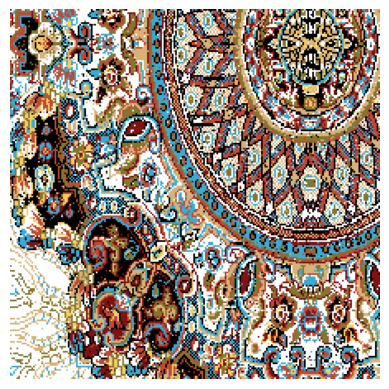

In [ ]:
substituted_img = substitute_pixels(img, max_step=5, num_substitutions=10000, translation_dist='uniform', selection_dist='uniform')

plt.imshow(substituted_img)
plt.axis('off')  # Turn off axis labels
plt.show()

# Anti-aliasing (Blurring) Techniques

- The color should not very from the ground truth (Like Motion Blur, But why?)
- Blurring can remove dithering and may ease edge detection
- Because color distribution is So SPARSE, Bilateral filtering needs very large Color Sigmas

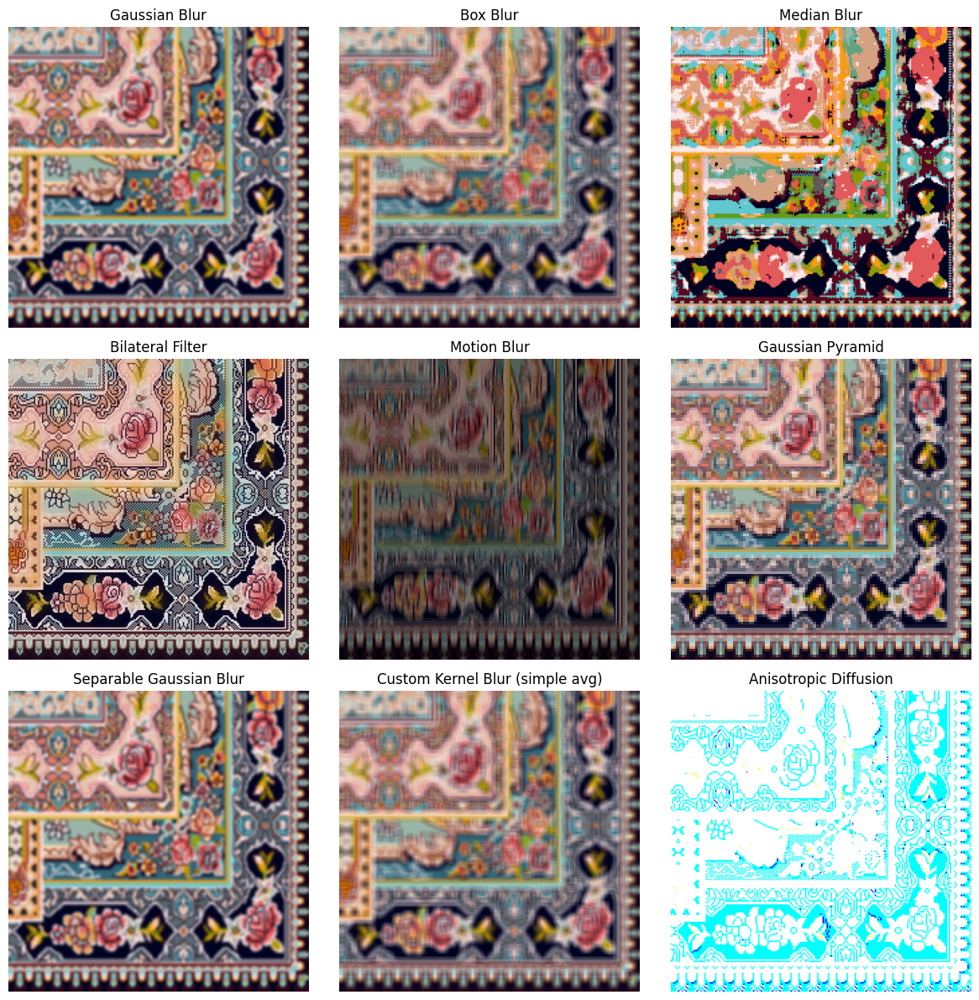

In [ ]:
import cv2

blurred_images = {}

img_np = np.array(img)

# 1. Gaussian Blur
gaussian_blur = cv2.GaussianBlur(img_np, (5, 5), 0)
blurred_images['Gaussian Blur'] = gaussian_blur

# 2. Box Blur (Mean Filter)
box_blur = cv2.blur(img_np, (5, 5))
blurred_images['Box Blur'] = box_blur

# 3. Median Blur
median_blur = cv2.medianBlur(img_np, 5)
blurred_images['Median Blur'] = median_blur

# 4. Bilateral Filter
bilateral_blur = cv2.bilateralFilter(img_np, d=15, sigmaColor=220, sigmaSpace=180)
blurred_images['Bilateral Filter'] = bilateral_blur

# 5. Motion Blur (Example horizontal motion blur)
def motion_blur(image, size, angle):
    kernel = np.zeros((size, size))
    center = size // 2
    angle_rad = np.deg2rad(angle)
    for i in range(size):
        x = int(center + np.cos(angle_rad) * i)
        y = int(center + np.sin(angle_rad) * i)
        if 0 <= x < size and 0 <= y < size:
            kernel[x, y] = 1
    kernel = kernel / size  # Normalize kernel
    return cv2.filter2D(image, -1, kernel)

motion_blurred_image = motion_blur(img_np, size=15, angle=0)  # Horizontal motion blur
blurred_images['Motion Blur'] = motion_blurred_image

# 6. Gaussian Pyramid (Downsampling example)
lower_resolution = cv2.pyrDown(img_np)
blurred_images['Gaussian Pyramid'] = lower_resolution

# 7. Separable Filters (Gaussian Blur with separable filters)
gaussian_separable = cv2.GaussianBlur(img_np, (5, 5), 0)
blurred_images['Separable Gaussian Blur'] = gaussian_separable

# 8. Custom Kernel-based Blurring (simple average blur)
kernel = np.ones((5, 5), np.float32) / 25
custom_blurred_image = cv2.filter2D(img_np, -1, kernel)
blurred_images['Custom Kernel Blur (simple avg)'] = custom_blurred_image

# 9. Anisotropic Diffusion (Perona-Malik filter)
def anisotropic_diffusion(image, num_iter, kappa=30, gamma=0.1):
    image = np.float32(image)
    for _ in range(num_iter):
        grad_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
        grad_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
        grad_mag = np.sqrt(grad_x ** 2 + grad_y ** 2)
        diffusion = np.exp(-(grad_mag / kappa) ** 2)
        image += gamma * (cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3) * diffusion)
    # return np.uint8(image)
    return image


anisotropic_blurred_image = anisotropic_diffusion(img_np, num_iter=10)
blurred_images['Anisotropic Diffusion'] = anisotropic_blurred_image

# Plotting all results in a parametric grid
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
axes = axes.ravel()

for i, (name, blr_img) in enumerate(blurred_images.items()):
    axes[i].imshow(blr_img)
    axes[i].set_title(name)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# Random noise



```
# This is formatted as code
```

## Changing the color of pixels
- from palette
- neighbourhood / background (removing)
- random
- If possible to set background color, If not just to black or white it out

In [17]:
import numpy as np
import cv2
from scipy import stats

def random_pixel_removal(image, num_pixels, selection_distribution='uniform', max_distance=1, default_color=None):
    h, w, c = image.shape
    new_image = image.copy()

    # Generate random coordinates
    if selection_distribution == 'uniform':
        ys = np.random.randint(0, h, size=num_pixels)
        xs = np.random.randint(0, w, size=num_pixels)
    elif selection_distribution == 'gaussian':
        center_x, center_y = w // 2, h // 2
        xs = np.clip(np.random.normal(center_x, w / 4, num_pixels).astype(int), 0, w - 1)
        ys = np.clip(np.random.normal(center_y, h / 4, num_pixels).astype(int), 0, h - 1)
    else:
        raise ValueError(f"Unknown selection_distribution: {selection_distribution}")

    for x, y in zip(xs, ys):
        x0 = max(0, x - max_distance)
        y0 = max(0, y - max_distance)
        x1 = min(w-1, x + max_distance)
        y1 = min(h-1, y + max_distance)

        neighborhood = new_image[y0:y1, x0:x1, :]
        if neighborhood.size == 0:
            color = default_color if default_color is not None else (0, 0, 0)
        else:
            flat_pixels = neighborhood.reshape(-1, c)
            mode_result = stats.mode(flat_pixels, axis=0, keepdims=False)
            mode_color = tuple(mode_result.mode) if mode_result.count[0] > 0 else default_color
            color = mode_color if mode_color is not None else (0, 0, 0)

        new_image[y, x] = color

    return new_image


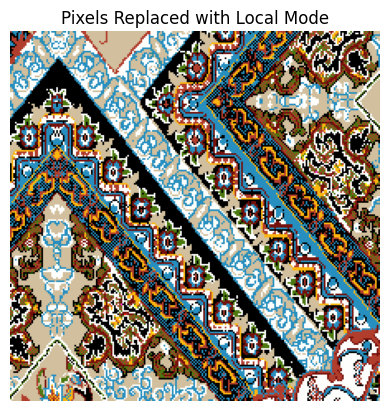

In [20]:
# Apply pixel removal
img_np = np.array(img)
modified_img = random_pixel_removal(
    image=img_np,
    num_pixels=7500,
    selection_distribution='uniform',
    max_distance=2,
    default_color=(255, 0, 0)
)

# Plot the result
import matplotlib.pyplot as plt
plt.imshow(modified_img)
plt.axis('off')
plt.title("Pixels Replaced with Local Mode")
plt.show()

# Adding salt & peper noise
- Adding salt an peper noise from a given color palette

In [22]:
import numpy as np

def color_palette_salt_pepper_noise(image, amount=0.01, salt_vs_pepper=0.5, palette=None):
    """
    Add salt-and-pepper noise to an image using a custom color palette.

    Parameters:
    - image: np.ndarray
        Input image (H, W, C).
    - amount: float
        Proportion of image pixels to alter.
    - salt_vs_pepper: float
        Proportion of salt vs. pepper noise (0.0 - all pepper, 1.0 - all salt).
    - palette: list of tuple
        List of RGB tuples (0-255) used to replace pixels instead of pure black/white.

    Returns:
    - noisy_image: np.ndarray
        Image with salt-and-pepper noise applied from palette.
    """
    if palette is None or len(palette) == 0:
        palette = [(0, 0, 0), (255, 255, 255)]  # default black and white

    noisy_image = image.copy()
    h, w = noisy_image.shape[:2]
    num_pixels = int(amount * h * w)

    # Salt noise (bright spots)
    num_salt = int(num_pixels * salt_vs_pepper)
    coords_salt = (
        np.random.randint(0, h, num_salt),
        np.random.randint(0, w, num_salt)
    )
    for y, x in zip(*coords_salt):
        noisy_image[y, x] = palette[np.random.randint(0, len(palette))]

    # Pepper noise (dark spots)
    num_pepper = num_pixels - num_salt
    coords_pepper = (
        np.random.randint(0, h, num_pepper),
        np.random.randint(0, w, num_pepper)
    )
    for y, x in zip(*coords_pepper):
        noisy_image[y, x] = palette[np.random.randint(0, len(palette))]

    return noisy_image

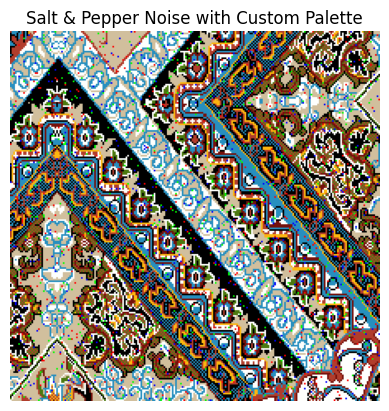

In [23]:
import matplotlib.pyplot as plt

palette = [(255, 0, 0), (0, 255, 0), (0, 0, 255)]  # red, green, blue

noisy_img = color_palette_salt_pepper_noise(img_np, amount=0.05, salt_vs_pepper=0.5, palette=palette)

plt.imshow(noisy_img)
plt.axis('off')
plt.title('Salt & Pepper Noise with Custom Palette')
plt.show()

# Gradients of palette colors
- Should not change the mode color (The original color)
- Learns the color space more efficiently

In [8]:
import numpy as np
import cv2

def sample_noise(shape, range_val, distribution='uniform'):
    if distribution == 'uniform':
        return np.random.uniform(-range_val, range_val, size=shape)
    elif distribution == 'normal':
        return np.random.normal(0, range_val / 2, size=shape).clip(-range_val, range_val)
    else:
        raise ValueError("Unsupported distribution. Use 'uniform' or 'normal'.")

def random_hsl_perturbation(image, amount=0.1, h_range=30, s_range=30, l_range=30, distribution='uniform'):
    img = image.copy()
    h, w = img.shape[:2]
    num_pixels = int(amount * h * w)

    coords = np.column_stack((
        np.random.randint(0, h, size=num_pixels),
        np.random.randint(0, w, size=num_pixels)
    ))

    # Convert to HLS (OpenCV uses HLS instead of HSL)
    img_hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float32)

    # Sample noise per channel
    h_noise = sample_noise(num_pixels, h_range, distribution)
    s_noise = sample_noise(num_pixels, s_range, distribution)
    l_noise = sample_noise(num_pixels, l_range, distribution)

    for i, (y, x) in enumerate(coords):
        h_val, l_val, s_val = img_hls[y, x]
        img_hls[y, x, 0] = (h_val + h_noise[i]) % 180  # Hue in OpenCV is [0, 180]
        img_hls[y, x, 1] = np.clip(l_val + l_noise[i], 0, 255)
        img_hls[y, x, 2] = np.clip(s_val + s_noise[i], 0, 255)

    img_rgb = cv2.cvtColor(img_hls.astype(np.uint8), cv2.COLOR_HLS2RGB)
    return img_rgb

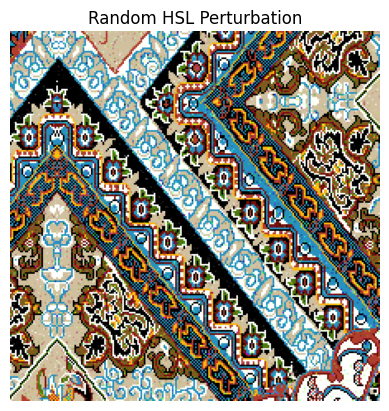

In [25]:
import matplotlib.pyplot as plt

out = random_hsl_perturbation(
    image=img_np,
    amount=0.2,
    h_range=30,
    s_range=40,
    l_range=50,
    distribution='normal'
)

plt.imshow(out)
plt.axis('off')
plt.title('Random HSL Perturbation')
plt.show()

# Dithered Sampling
- Simulate halftoning or newspaper print-like patterns.



# Compression & Transmission Simulation
- **JPEG Artifacts**  
  Apply variable JPEG compression to parts of the image.

- **Color Banding**  
  Quantize gradients to fewer steps.


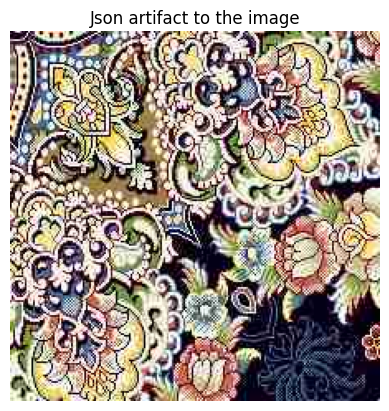

In [17]:
from PIL import Image
import io
import numpy as np

def add_jpeg_artifacts(image_np: np.ndarray, quality: int = 20) -> np.ndarray:
    if image_np.dtype != np.uint8:
        raise ValueError("Input image must be of dtype uint8.")

    pil_image = Image.fromarray(image_np)
    buffer = io.BytesIO()
    pil_image.save(buffer, format='JPEG', quality=quality)
    buffer.seek(0)
    compressed_pil = Image.open(buffer)
    return np.array(compressed_pil)

augmented_image = add_jpeg_artifacts(
    image_np=img_np,
    quality= 20
)

plt.imshow(augmented_image)
plt.axis('off')
plt.title('Json artifact to the image')
plt.show()

# Topological/Structural Perturbations

- **Edge Deformation**  
  Corrupt the contours/edges while keeping texture intact.

- **Superpixel-based Jitter**  
  Segment into superpixels and randomly shift or recolor them.

- **Graph-Based Perturbation**  
  Convert to region-graph and perturb the adjacency or

# Local Structure Shuffle (cutblur/cutmix...)

In [1]:
import numpy as np
from PIL import Image

def apply_augmentation_to_random_crops(
    image,
    num_crops,
    crop_size_mean,
    sample_distribution,
    augmentation_fn
):
    img_np = np.array(image)
    h, w = img_np.shape[:2]

    for _ in range(num_crops):
        # Sample crop size
        crop_size = int(sample_distribution(crop_size_mean))
        crop_size = max(1, min(min(h, w), crop_size))  # keep within bounds

        # Sample top-left corner
        x = np.random.randint(0, w - crop_size + 1)
        y = np.random.randint(0, h - crop_size + 1)

        # Extract the crop
        crop = img_np[y:y+crop_size, x:x+crop_size]

        # Apply augmentation
        crop_aug = augmentation_fn(crop)

        # Resize augmented crop back if needed
        if crop_aug.shape != crop.shape:
            crop_aug = np.array(Image.fromarray(crop_aug).resize((crop_size, crop_size)))

        # Paste it back
        img_np[y:y+crop_size, x:x+crop_size] = crop_aug

    return Image.fromarray(img_np.astype(np.uint8))

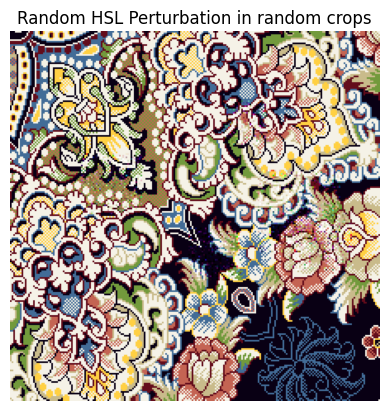

In [14]:
import matplotlib.pyplot as plt

img_np = np.array(img)
mean_crop_size = img_np.shape[0]//6 # 0r 50

sample_dist = lambda mean: np.random.normal(loc=mean, scale=mean * 0.2)
aug_func = lambda crop: random_hsl_perturbation(
    image=crop,
    amount=0.6,
    h_range=30,
    s_range=40,
    l_range=50,
    distribution='normal'
)

augmented_image = apply_augmentation_to_random_crops(
    image=img_np,
    num_crops=5,
    crop_size_mean=mean_crop_size,
    sample_distribution=sample_dist,
    augmentation_fn=aug_func
)

plt.imshow(augmented_image)
plt.axis('off')
plt.title('Random HSL Perturbation in random crops')
plt.show()

# Resize and Return

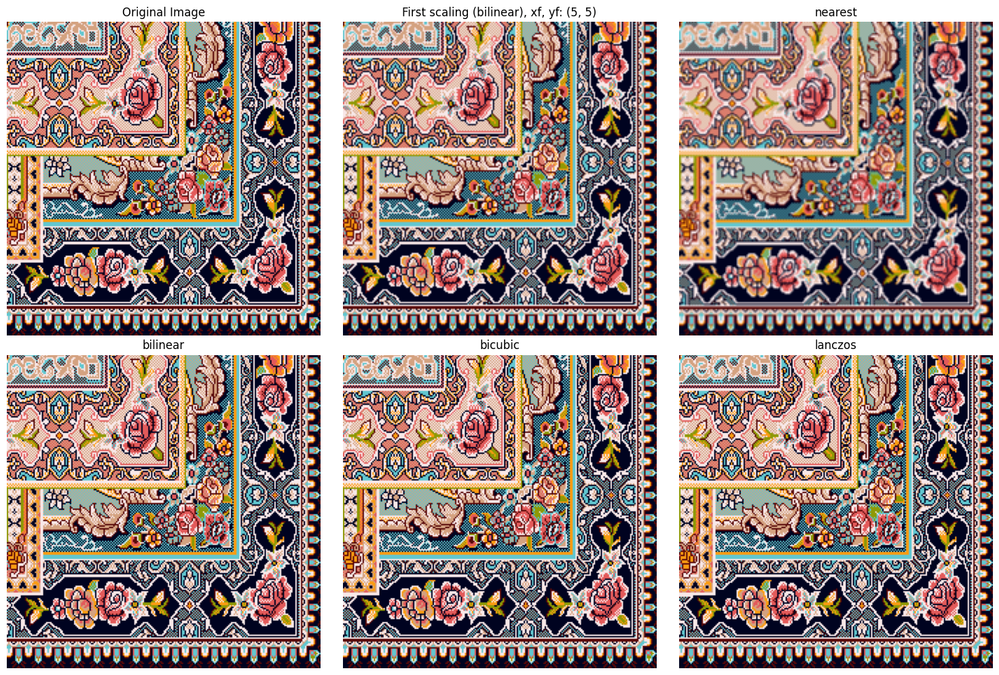

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image

def resize_image(image, fx, fy, upscale_algorithm=cv2.INTER_LINEAR):
    return cv2.resize(image, None, fx=fx, fy=fy, interpolation=upscale_algorithm)

def resize_back_image(image, orig_shape, downscale_algorithm=cv2.INTER_NEAREST):
    return cv2.resize(image, orig_shape, interpolation=downscale_algorithm)

def apply_resizing_and_plot(image, initial_scaling=cv2.INTER_LINEAR, scaling_algorithms={}, x_factor=2, y_factor=2):
    orig_shape = image.shape[1], image.shape[0]  # (width, height)

    first_scaling_method = scaling_algorithms[initial_scaling]
    resized = resize_image(image, fx=x_factor, fy=y_factor, upscale_algorithm=first_scaling_method)

    resized_images = {}
    for name, downscale_algorithm in scaling_algorithms.items():
        resized_images[name] = resize_back_image(resized, orig_shape, downscale_algorithm=downscale_algorithm)

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.ravel()

    axes[0].imshow(image)
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(resized)
    axes[1].set_title(f'First scaling ({initial_scaling}), xf, yf: ({x_factor}, {y_factor})')
    axes[1].axis('off')

    for i, (name, img) in enumerate(resized_images.items()):
        axes[i + 2].imshow(img)
        axes[i + 2].set_title(name)
        axes[i + 2].axis('off')

    plt.tight_layout()
    plt.show()


# Example usage:
scaling_algorithms = {
    'nearest': cv2.INTER_NEAREST,
    'bilinear': cv2.INTER_LINEAR,
    'bicubic': cv2.INTER_CUBIC,
    'lanczos': cv2.INTER_LANCZOS4
}

apply_resizing_and_plot(img_np, initial_scaling='bilinear', scaling_algorithms=scaling_algorithms, x_factor=5, y_factor=5)

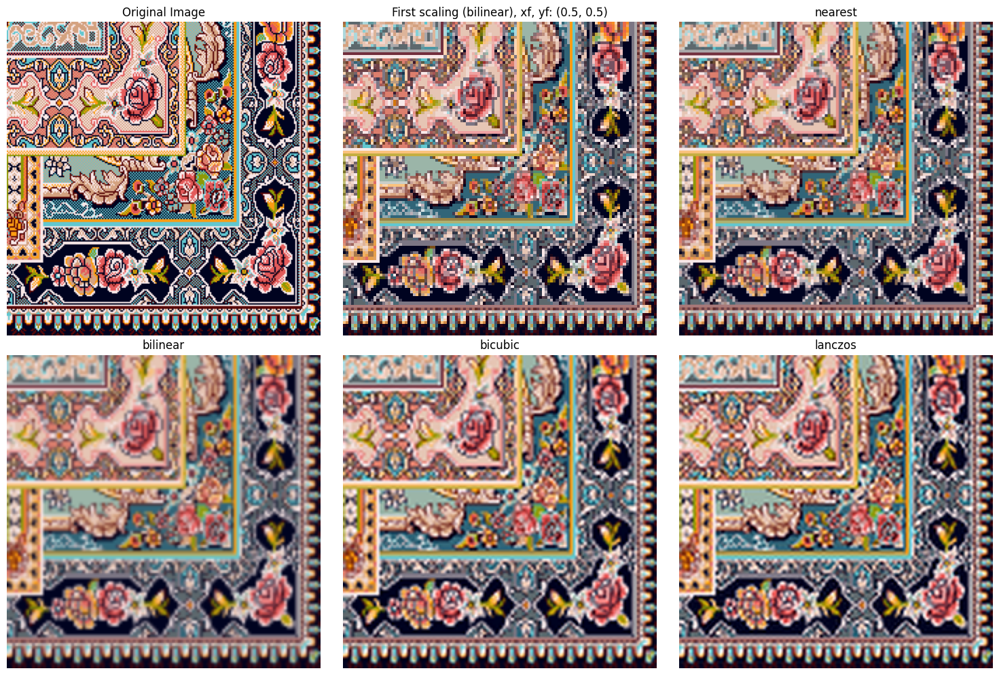

In [ ]:
apply_resizing_and_plot(img_np, initial_scaling='bilinear', scaling_algorithms=scaling_algorithms, x_factor=.5, y_factor=.5)

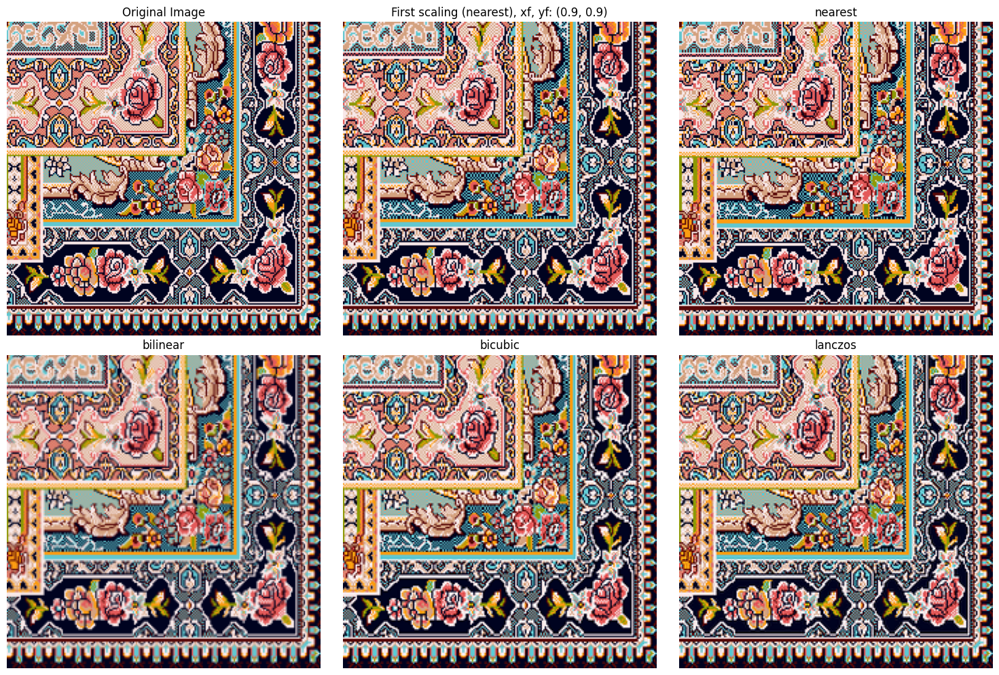

In [ ]:
apply_resizing_and_plot(img_np, initial_scaling='nearest', scaling_algorithms=scaling_algorithms, x_factor=.9, y_factor=.9)

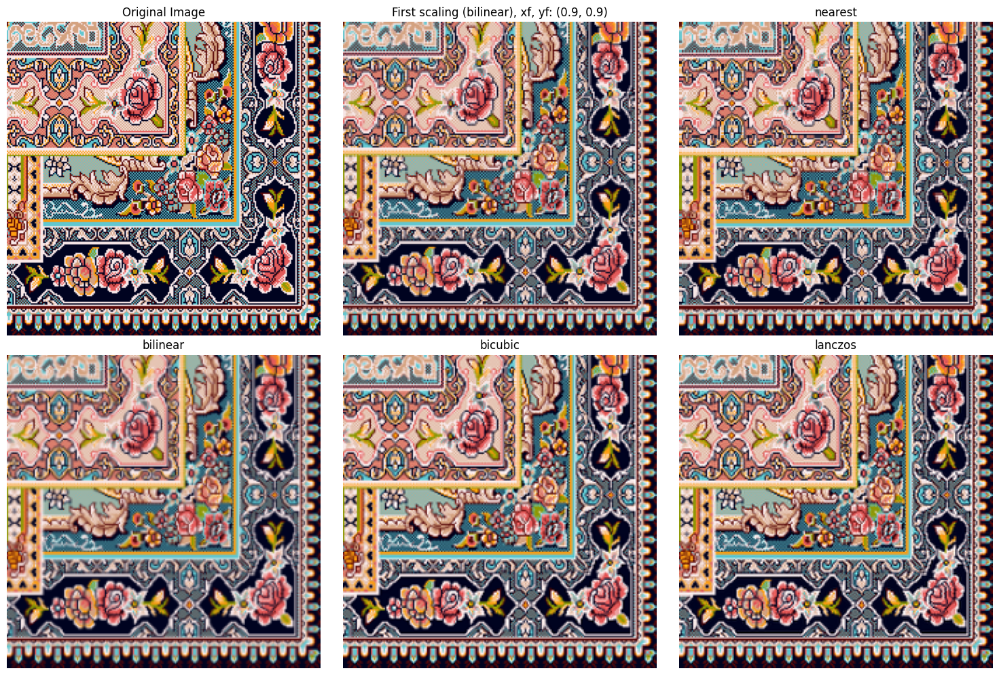

In [ ]:
apply_resizing_and_plot(img_np, initial_scaling='bilinear', scaling_algorithms=scaling_algorithms, x_factor=.9, y_factor=.9)